## Car Market Explorer: Analyzing and Visualizing Vehicle Listings

Project Overview

This project aims to develop and deploy a web application dashboard for analyzing car sales advertisements data. The dashboard will provide users with insights through exploratory data analysis (EDA) visualizations such as histograms and scatter plots. The project utilizes Python, Streamlit, Plotly Express, and other necessary libraries for data manipulation and visualization.

In [70]:
#import statsmodels.api as sm
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [71]:
try:
    vehicles = pd.read_csv("/workspaces/Software-Development-Tools-Project/vehicles_us.csv")

except FileNotFoundError:
    vehicles = pd.read_csv("C:/Users/alejo/OneDrive/Documents/GitHub/SDT Project/vehicles_us.csv")


Below we perfomr a basic data exploration. We will print info, shape and a sample of the data frame to get an initial understanding of the data

In [72]:
#Basic Data Exploration
vehicles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51525 entries, 0 to 51524
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         51525 non-null  int64  
 1   model_year    47906 non-null  float64
 2   model         51525 non-null  object 
 3   condition     51525 non-null  object 
 4   cylinders     46265 non-null  float64
 5   fuel          51525 non-null  object 
 6   odometer      43633 non-null  float64
 7   transmission  51525 non-null  object 
 8   type          51525 non-null  object 
 9   paint_color   42258 non-null  object 
 10  is_4wd        25572 non-null  float64
 11  date_posted   51525 non-null  object 
 12  days_listed   51525 non-null  int64  
dtypes: float64(4), int64(2), object(7)
memory usage: 5.1+ MB


In [73]:
vehicles.sample(5)

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
21378,19995,2016.0,honda odyssey,excellent,6.0,gas,30472.0,automatic,van,white,NaN,2018-07-27,13
41537,12000,2014.0,subaru forester,excellent,4.0,gas,105435.0,manual,wagon,NaN,1.0,2019-01-21,53
17003,1,2017.0,jeep wrangler,excellent,10.0,gas,38617.0,other,SUV,black,1.0,2018-05-27,72
15861,1900,2005.0,chevrolet suburban,fair,8.0,gas,153041.0,automatic,truck,white,NaN,2018-10-13,25
16164,5700,2011.0,ford f250 super duty,good,8.0,other,212000.0,automatic,truck,NaN,NaN,2019-01-02,14


In [74]:
vehicles.shape

(51525, 13)

It seems like the DataFrame contains information about used car listings. Here's a breakdown of the columns:

- price: The price of the car.

- model_year: The year the car model was manufactured.

- model: The model of the car.

- condition: The condition of the car (e.g., excellent, good, etc.).

- cylinders: The number of cylinders in the engine.

- fuel: The type of fuel the car uses.

- odometer: The reading on the odometer, indicating the distance the car has traveled.

- transmission: The type of transmission (e.g., automatic, manual).

- type: The type of vehicle (e.g., SUV, pickup, coupe).

- paint_color: The color of the car.

- is_4wd: Indicates whether the car has four-wheel drive (NaN indicates missing values).

- date_posted: The date when the listing was posted.

- days_listed: The number of days the listing was active.

- Each row represents a single car listing.

In [75]:
#checking for null values
vehicles.isnull().sum()

price               0
model_year       3619
model               0
condition           0
cylinders        5260
fuel                0
odometer         7892
transmission        0
type                0
paint_color      9267
is_4wd          25953
date_posted         0
days_listed         0
dtype: int64

In [76]:
#Checking for duplicates
vehicles.duplicated().sum()

0

Fixing and enhansing data for obvious issues with data from initial observation.

In [77]:
#Converting 'date_posted' into datetime format
vehicles['date_posted'] = pd.to_datetime(vehicles['date_posted'])

#Display the updated data types and sample data 
vehicles.info()
vehicles.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51525 entries, 0 to 51524
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   price         51525 non-null  int64         
 1   model_year    47906 non-null  float64       
 2   model         51525 non-null  object        
 3   condition     51525 non-null  object        
 4   cylinders     46265 non-null  float64       
 5   fuel          51525 non-null  object        
 6   odometer      43633 non-null  float64       
 7   transmission  51525 non-null  object        
 8   type          51525 non-null  object        
 9   paint_color   42258 non-null  object        
 10  is_4wd        25572 non-null  float64       
 11  date_posted   51525 non-null  datetime64[ns]
 12  days_listed   51525 non-null  int64         
dtypes: datetime64[ns](1), float64(4), int64(2), object(6)
memory usage: 5.1+ MB


,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
0,9400,2011.0,bmw x5,good,6.0,gas,145000.0,automatic,SUV,NaN,1.0,2018-06-23,19
1,25500,NaN,ford f-150,good,6.0,gas,88705.0,automatic,pickup,white,1.0,2018-10-19,50
2,5500,2013.0,hyundai sonata,like new,4.0,gas,110000.0,automatic,sedan,red,NaN,2019-02-07,79
3,1500,2003.0,ford f-150,fair,8.0,gas,NaN,automatic,pickup,NaN,NaN,2019-03-22,9
4,14900,2017.0,chrysler 200,excellent,4.0,gas,80903.0,automatic,sedan,black,NaN,2019-04-02,28


In [78]:
# Descriptive Statistics
vehicles.describe()

,price,model_year,cylinders,odometer,is_4wd,date_posted,days_listed
count,51525.000000,47906.000000,46265.000000,43633.000000,25572.0,51525,51525.00000
mean,12132.464920,2009.750470,6.125235,115553.461738,1.0,2018-10-25 01:57:46.270742528,39.55476
min,1.000000,1908.000000,3.000000,0.000000,1.0,2018-05-01 00:00:00,0.00000
25%,5000.000000,2006.000000,4.000000,70000.000000,1.0,2018-07-29 00:00:00,19.00000
50%,9000.000000,2011.000000,6.000000,113000.000000,1.0,2018-10-25 00:00:00,33.00000
75%,16839.000000,2014.000000,8.000000,155000.000000,1.0,2019-01-21 00:00:00,53.00000
max,375000.000000,2019.000000,12.000000,990000.000000,1.0,2019-04-19 00:00:00,271.00000
std,10040.803015,6.282065,1.660360,65094.611341,0.0,NaN,28.20427


In [79]:
vehicles['condition'].value_counts()

condition
excellent    24773
good         20145
like new      4742
fair          1607
new            143
salvage        115
Name: count, dtype: int64

In [ ]:
# Grouping by 'model' and 'model_year', then filling NaN values in 'cylinders' column with the median value
vehicles['cylinders'] = vehicles.groupby(['model', 'model_year'])['cylinders'].transform(lambda x: x.fillna(x.median()))

# Displaying the updated DataFrame
vehicles.sample(5)

c:\Users\alejo\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning:

Mean of empty slice

c:\Users\alejo\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning:

Mean of empty slice

c:\Users\alejo\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning:

Mean of empty slice

c:\Users\alejo\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning:

Mean of empty slice

c:\Users\alejo\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning:

Mean of empty slice

c:\Users\alejo\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning:

Mean of empty slice

c:\Users\alejo\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning:

Mean of empty slice


,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
30988,39998,2016.0,jeep wrangler unlimited,excellent,6.0,gas,28000.0,automatic,SUV,black,1.0,2019-04-06,88
36022,5995,NaN,cadillac escalade,excellent,NaN,gas,153115.0,automatic,SUV,white,1.0,2018-12-23,28
4623,32990,2016.0,ford f-250 sd,good,8.0,gas,5031.0,automatic,truck,black,1.0,2018-09-07,36
9969,9995,2004.0,ram 2500,excellent,6.0,diesel,247152.0,manual,truck,white,NaN,2018-05-12,8
37220,6995,2011.0,chrysler town & country,excellent,6.0,gas,113000.0,automatic,mini-van,custom,NaN,2019-02-26,37


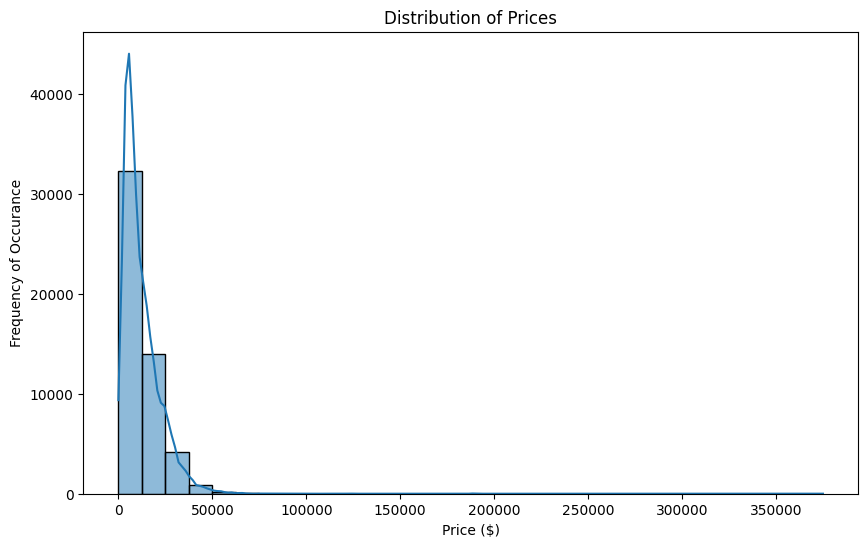

In [ ]:
# Data Visualization
plt.figure(figsize=(10, 6))
sns.histplot(vehicles['price'], bins=30, kde=True)
plt.title('Distribution of Prices')
plt.xlabel('Price ($)')
plt.ylabel('Frequency of Occurance')
plt.show()


The histogram visualizes the distribution of prices for the vehicles in the dataset. By using bins to group prices into intervals and overlaying a kernel density estimate (KDE), it provides insights into the central tendency, spread, and shape of the price distribution. This visualization helps in understanding the range of prices and their frequency of occurrence, aiding in identifying common price ranges and potential outliers in the dataset.

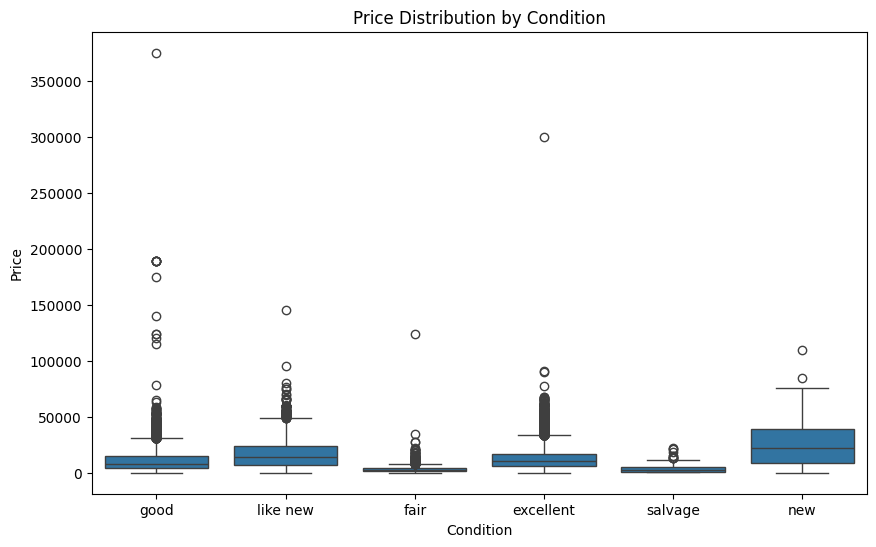

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='condition', y='price', data=vehicles)
plt.title('Price Distribution by Condition')
plt.xlabel('Condition')
plt.ylabel('Price')
plt.show()

The boxplot illustrates the distribution of prices across different conditions of vehicles listed in the dataset. It displays the median, quartiles, and potential outliers for each condition category, allowing for easy comparison of price distributions between conditions. This visualization aids in understanding how the condition of a vehicle influences its price, providing valuable insights into the market dynamics and pricing trends based on vehicle condition.

- The x-axis label specifies the unit of the price (dollars).
- The y-axis label indicates the frequency of occurrence, which is appropriate for a histogram.

In [97]:
# Histogram of Price
fig = px.histogram(vehicles, x='price', title='Histogram of Price')
fig.show()

The histogram of price provides a visual representation of the distribution of prices for vehicles in the dataset. The x-axis represents the price range, segmented into bins, while the y-axis represents the frequency or count of vehicles falling within each price range.

The histogram allows us to observe the central tendency, spread, and shape of the price distribution. It helps in identifying common price ranges and potential outliers within the dataset. Additionally, the histogram aids in understanding the overall distribution of prices, providing insights into the market dynamics and pricing trends for vehicles.

In [98]:
# Histogram of Odometer
fig = px.histogram(vehicles, x='odometer', title='Histogram of Odometer')
fig.show()

The histogram of odometer provides a visual representation of the distribution of odometer readings for vehicles in the dataset. The x-axis represents the odometer reading range, segmented into bins, while the y-axis represents the frequency or count of vehicles falling within each odometer reading range.

This histogram allows us to observe the distribution of mileage across the vehicles in the dataset, providing insights into the usage patterns and mileage accumulation of the vehicles. It helps in identifying common mileage ranges and potential outliers, aiding in understanding the condition and usage history of the vehicles.

In [99]:
# Scatter Plot of Price vs. Days Listed
fig = px.scatter(vehicles, x='days_listed', y='price', title='Price vs. Days Listed')
fig.show()

The scatter plot of price vs. days listed displays the relationship between the price of vehicles and the number of days they are listed for sale. Each point on the plot represents a vehicle, with its x-coordinate corresponding to the number of days it was listed and its y-coordinate representing the price.

This visualization allows us to explore any potential patterns or trends between the listing duration and the price of vehicles. It can help in understanding how the duration of listing affects the pricing strategy or market demand for vehicles. Additionally, outliers or clusters of points in the scatter plot can provide insights into specific listings' behaviors or market dynamics.

In [100]:
# Scatter Plot of Odometer vs. Days Listed
fig = px.scatter(vehicles, x='days_listed', y='odometer', title='Odometer vs. Days Listed')
fig.show()

In [101]:
# Histogram of Price with Condition Color Encoding
fig = px.histogram(vehicles, x='price', color='condition', title='Histogram of Price by Condition')
fig.show()

In [105]:
#Scatter Plot of Price vs. Mileage
fig = px.scatter(vehicles, x='odometer', y='price', title='Price vs. Mileage', trendline='ols')
fig.show()

The scatter plot of price vs. mileage illustrates the relationship between the price of vehicles and their odometer readings (mileage). Each point on the plot represents a vehicle, with its x-coordinate corresponding to the odometer reading (mileage) and its y-coordinate representing the price.

This visualization enables the examination of how vehicle prices vary with mileage. The trendline overlayed on the scatter plot, calculated using ordinary least squares (OLS) regression, indicates the overall trend or direction of the relationship between price and mileage.

Analyzing this graph can provide insights into the depreciation of vehicle value with increased mileage, helping understand the market dynamics and pricing factors influenced by vehicle usage.

In [106]:
# Scatter Plot of Price vs. Days Listed with Fuel Color Encoding
fig = px.scatter(vehicles, x='days_listed', y='price', color='fuel', title='Price vs. Days Listed with Fuel Encoding')
fig.show()

Conclusions

 Data Preparation: The dataset (vehicles_us.csv) was downloaded and used for analysis. Necessary Python packages were installed, and a virtual environment was set up to manage dependencies.

Exploratory Data Analysis (EDA): Basic EDA was performed on the dataset using Jupyter Notebook. Various visualizations were created to explore relationships and distributions within the data.

Web Application Development: Using Streamlit, a web application was developed to visualize the insights gained from EDA. The application includes headers, histograms, scatter plots, and interactive components such as checkboxes.

Overall Conclusion

The project successfully demonstrates the process of developing and deploying a web application dashboard for analyzing car sales advertisements data. By leveraging Python, Streamlit, and Plotly Express, users can interactively explore the dataset and gain valuable insights into car sales trends.